# Homework 3
## Jesse Ellin
## Neural Networks

In [1]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, Normalizer
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, accuracy_score, log_loss, recall_score, precision_score
import torch

C:\Users\iamje\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\iamje\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\iamje\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"
C:\Users\iamje\AppData\Roaming\Python\Python310\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Data
Data source: https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/HG7NV7
This data contains flight information for United States flights from 1987 to 2008. For the sake of computer memory, I specifically selected the 2008 data, as the entire dataset is beyond massive. The goal for this project is to learn a binary classification model to predict whether or not a flight will be impacted (i.e. delayed, cancelled, redirected, etc.).

### Data Loading
We load in two different dataframes, one contains the actual data, the other contains the column descriptors

In [2]:
df = pd.read_csv("2008.csv.bz2")

In [3]:
descriptors = pd.read_csv("variable-descriptions.csv")

In [4]:
df.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,2008,1,3,4,1343.0,1325,1451.0,1435,WN,588,...,4.0,9.0,0,NaN,0,16.0,0.0,0.0,0.0,0.0
1,2008,1,3,4,1125.0,1120,1247.0,1245,WN,1343,...,3.0,8.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
2,2008,1,3,4,2009.0,2015,2136.0,2140,WN,3841,...,2.0,14.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
3,2008,1,3,4,903.0,855,1203.0,1205,WN,3,...,5.0,7.0,0,NaN,0,NaN,NaN,NaN,NaN,NaN
4,2008,1,3,4,1423.0,1400,1726.0,1710,WN,25,...,6.0,10.0,0,NaN,0,16.0,0.0,0.0,0.0,0.0


In [5]:
descriptors.dropna()

,Variable descriptions,Unnamed: 1,Unnamed: 2
2,1.0,Year,1987-2008
3,2.0,Month,12-Jan
4,3.0,DayofMonth,31-Jan
5,4.0,DayOfWeek,1 (Monday) - 7 (Sunday)
6,5.0,DepTime,"actual departure time (local, hhmm)"
7,6.0,CRSDepTime,"scheduled departure time (local, hhmm)"
8,7.0,ArrTime,"actual arrival time (local, hhmm)"
9,8.0,CRSArrTime,"scheduled arrival time (local, hhmm)"
10,9.0,UniqueCarrier,unique carrier code
11,10.0,FlightNum,flight number


These particular columns have large amounts of NaN values and are descriptors of other columns, making them redundant

In [6]:
df = df.drop(labels=["CancellationCode", "CarrierDelay", "WeatherDelay", "NASDelay", "SecurityDelay", "LateAircraftDelay"], axis=1)

In [7]:
df.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,Diverted
0,2008,1,3,4,1343.0,1325,1451.0,1435,WN,588,...,55.0,16.0,18.0,HOU,LIT,393,4.0,9.0,0,0
1,2008,1,3,4,1125.0,1120,1247.0,1245,WN,1343,...,71.0,2.0,5.0,HOU,MAF,441,3.0,8.0,0,0
2,2008,1,3,4,2009.0,2015,2136.0,2140,WN,3841,...,71.0,-4.0,-6.0,HOU,MAF,441,2.0,14.0,0,0
3,2008,1,3,4,903.0,855,1203.0,1205,WN,3,...,108.0,-2.0,8.0,HOU,MCO,848,5.0,7.0,0,0
4,2008,1,3,4,1423.0,1400,1726.0,1710,WN,25,...,107.0,16.0,23.0,HOU,MCO,848,6.0,10.0,0,0


In [8]:
df.describe()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,FlightNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Distance,TaxiIn,TaxiOut,Cancelled,Diverted
count,2389217.0,2.389217e+06,2.389217e+06,2.389217e+06,2.324775e+06,2.389217e+06,2.319121e+06,2.389217e+06,2.389217e+06,2.319121e+06,2.388810e+06,2.319121e+06,2.319121e+06,2.324775e+06,2.389217e+06,2.319121e+06,2.324775e+06,2.389217e+06,2.389217e+06
mean,2008.0,2.505009e+00,1.566386e+01,3.909625e+00,1.340018e+03,1.329992e+03,1.485835e+03,1.496744e+03,2.213888e+03,1.286189e+02,1.293776e+02,1.051016e+02,1.027357e+01,1.143636e+01,7.261589e+02,6.839862e+00,1.668584e+01,2.697202e-02,2.366466e-03
std,0.0,1.121493e+00,8.750405e+00,1.980431e+00,4.802717e+02,4.657833e+02,5.081295e+02,4.845238e+02,1.951392e+03,7.025303e+01,6.948246e+01,6.766801e+01,3.963429e+01,3.653229e+01,5.571763e+02,4.846435e+00,1.102905e+01,1.620017e-01,4.858875e-02
min,2008.0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.400000e+01,-2.500000e+01,0.000000e+00,-9.100000e+01,-9.200000e+01,1.700000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2008.0,1.000000e+00,8.000000e+00,2.000000e+00,9.300000e+02,9.270000e+02,1.110000e+03,1.115000e+03,6.050000e+02,7.800000e+01,8.000000e+01,5.600000e+01,-9.000000e+00,-4.000000e+00,3.250000e+02,4.000000e+00,1.000000e+01,0.000000e+00,0.000000e+00
50%,2008.0,3.000000e+00,1.600000e+01,4.000000e+00,1.330000e+03,1.325000e+03,1.516000e+03,1.520000e+03,1.544000e+03,1.110000e+02,1.110000e+02,8.700000e+01,0.000000e+00,0.000000e+00,5.830000e+02,6.000000e+00,1.400000e+01,0.000000e+00,0.000000e+00
75%,2008.0,4.000000e+00,2.300000e+01,6.000000e+00,1.733000e+03,1.720000e+03,1.914000e+03,1.910000e+03,3.631000e+03,1.600000e+02,1.600000e+02,1.340000e+02,1.500000e+01,1.100000e+01,9.570000e+02,8.000000e+00,1.900000e+01,0.000000e+00,0.000000e+00
max,2008.0,4.000000e+00,3.100000e+01,7.000000e+00,2.400000e+03,2.359000e+03,2.400000e+03,2.400000e+03,9.741000e+03,9.050000e+02,1.435000e+03,8.860000e+02,2.461000e+03,2.467000e+03,4.962000e+03,2.130000e+02,3.830000e+02,1.000000e+00,1.000000e+00


In [9]:
df.shape

(2389217, 23)

In [10]:
df.isna().sum()

Year                     0
Month                    0
DayofMonth               0
DayOfWeek                0
DepTime              64442
CRSDepTime               0
ArrTime              70096
CRSArrTime               0
UniqueCarrier            0
FlightNum                0
TailNum              42452
ActualElapsedTime    70096
CRSElapsedTime         407
AirTime              70096
ArrDelay             70096
DepDelay             64442
Origin                   0
Dest                     0
Distance                 0
TaxiIn               70096
TaxiOut              64442
Cancelled                0
Diverted                 0
dtype: int64

Since the dataset is so large, I am not concerned about loss of data so we can safely drop all NaN rows

In [11]:
df = df.dropna()

In [12]:
df.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,AirTime,ArrDelay,DepDelay,Origin,Dest,Distance,TaxiIn,TaxiOut,Cancelled,Diverted
0,2008,1,3,4,1343.0,1325,1451.0,1435,WN,588,...,55.0,16.0,18.0,HOU,LIT,393,4.0,9.0,0,0
1,2008,1,3,4,1125.0,1120,1247.0,1245,WN,1343,...,71.0,2.0,5.0,HOU,MAF,441,3.0,8.0,0,0
2,2008,1,3,4,2009.0,2015,2136.0,2140,WN,3841,...,71.0,-4.0,-6.0,HOU,MAF,441,2.0,14.0,0,0
3,2008,1,3,4,903.0,855,1203.0,1205,WN,3,...,108.0,-2.0,8.0,HOU,MCO,848,5.0,7.0,0,0
4,2008,1,3,4,1423.0,1400,1726.0,1710,WN,25,...,107.0,16.0,23.0,HOU,MCO,848,6.0,10.0,0,0


In [13]:
df.shape

(2319119, 23)

In [14]:
df.isna().sum()

Year                 0
Month                0
DayofMonth           0
DayOfWeek            0
DepTime              0
CRSDepTime           0
ArrTime              0
CRSArrTime           0
UniqueCarrier        0
FlightNum            0
TailNum              0
ActualElapsedTime    0
CRSElapsedTime       0
AirTime              0
ArrDelay             0
DepDelay             0
Origin               0
Dest                 0
Distance             0
TaxiIn               0
TaxiOut              0
Cancelled            0
Diverted             0
dtype: int64

In [15]:
df["UniqueCarrier"].unique()

array(['WN', 'XE', 'YV', 'OH', 'OO', 'UA', 'US', 'DL', 'EV', 'F9', 'FL',
       'HA', 'MQ', 'NW', '9E', 'AA', 'AQ', 'AS', 'B6', 'CO'], dtype=object)

We want to convert all categorical data into numerical, which we can do simply with a LabelEncoder

In [16]:
categories = ["UniqueCarrier", "TailNum", "Origin", "Dest"]
for cat in categories:
    encoder = LabelEncoder()
    df[f"{cat}Category"] = encoder.fit_transform(df[cat])
df = df.drop(categories, axis=1)

In [17]:
df.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,FlightNum,ActualElapsedTime,...,DepDelay,Distance,TaxiIn,TaxiOut,Cancelled,Diverted,UniqueCarrierCategory,TailNumCategory,OriginCategory,DestCategory
0,2008,1,3,4,1343.0,1325,1451.0,1435,588,68.0,...,18.0,393,4.0,9.0,0,0,17,891,127,159
1,2008,1,3,4,1125.0,1120,1247.0,1245,1343,82.0,...,5.0,441,3.0,8.0,0,0,17,2430,127,165
2,2008,1,3,4,2009.0,2015,2136.0,2140,3841,87.0,...,-6.0,441,2.0,14.0,0,0,17,1040,127,165
3,2008,1,3,4,903.0,855,1203.0,1205,3,120.0,...,8.0,848,5.0,7.0,0,0,17,1154,127,169
4,2008,1,3,4,1423.0,1400,1726.0,1710,25,123.0,...,23.0,848,6.0,10.0,0,0,17,2073,127,169


Any column with "Actual" in its lable is data that is collected after the flight has occured, so we can't use this column on flights that have not occured. There is also a very direct, easy to design relation between planned flight details, actual flight details, and the flight being impacted, so we drop the "Actual" columns to make this problem more complex.

In [18]:
df = df.drop([col for col in df.columns if "Actual" in col], axis=1)

In [19]:
df.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,FlightNum,CRSElapsedTime,...,DepDelay,Distance,TaxiIn,TaxiOut,Cancelled,Diverted,UniqueCarrierCategory,TailNumCategory,OriginCategory,DestCategory
0,2008,1,3,4,1343.0,1325,1451.0,1435,588,70.0,...,18.0,393,4.0,9.0,0,0,17,891,127,159
1,2008,1,3,4,1125.0,1120,1247.0,1245,1343,85.0,...,5.0,441,3.0,8.0,0,0,17,2430,127,165
2,2008,1,3,4,2009.0,2015,2136.0,2140,3841,85.0,...,-6.0,441,2.0,14.0,0,0,17,1040,127,165
3,2008,1,3,4,903.0,855,1203.0,1205,3,130.0,...,8.0,848,5.0,7.0,0,0,17,1154,127,169
4,2008,1,3,4,1423.0,1400,1726.0,1710,25,130.0,...,23.0,848,6.0,10.0,0,0,17,2073,127,169


Generate a single binary label column for any sort of impact to the flight

In [20]:
df["Impacted"] = df[["ArrDelay", "Cancelled", "Diverted"]].apply(lambda x: True if x["ArrDelay"] > 0 or x["Cancelled"] != 0 or x["Diverted"] != 0 else False, axis=1)

In [21]:
df.head()

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,FlightNum,CRSElapsedTime,...,Distance,TaxiIn,TaxiOut,Cancelled,Diverted,UniqueCarrierCategory,TailNumCategory,OriginCategory,DestCategory,Impacted
0,2008,1,3,4,1343.0,1325,1451.0,1435,588,70.0,...,393,4.0,9.0,0,0,17,891,127,159,True
1,2008,1,3,4,1125.0,1120,1247.0,1245,1343,85.0,...,441,3.0,8.0,0,0,17,2430,127,165,True
2,2008,1,3,4,2009.0,2015,2136.0,2140,3841,85.0,...,441,2.0,14.0,0,0,17,1040,127,165,False
3,2008,1,3,4,903.0,855,1203.0,1205,3,130.0,...,848,5.0,7.0,0,0,17,1154,127,169,False
4,2008,1,3,4,1423.0,1400,1726.0,1710,25,130.0,...,848,6.0,10.0,0,0,17,2073,127,169,True


In [22]:
df.shape

(2319119, 23)

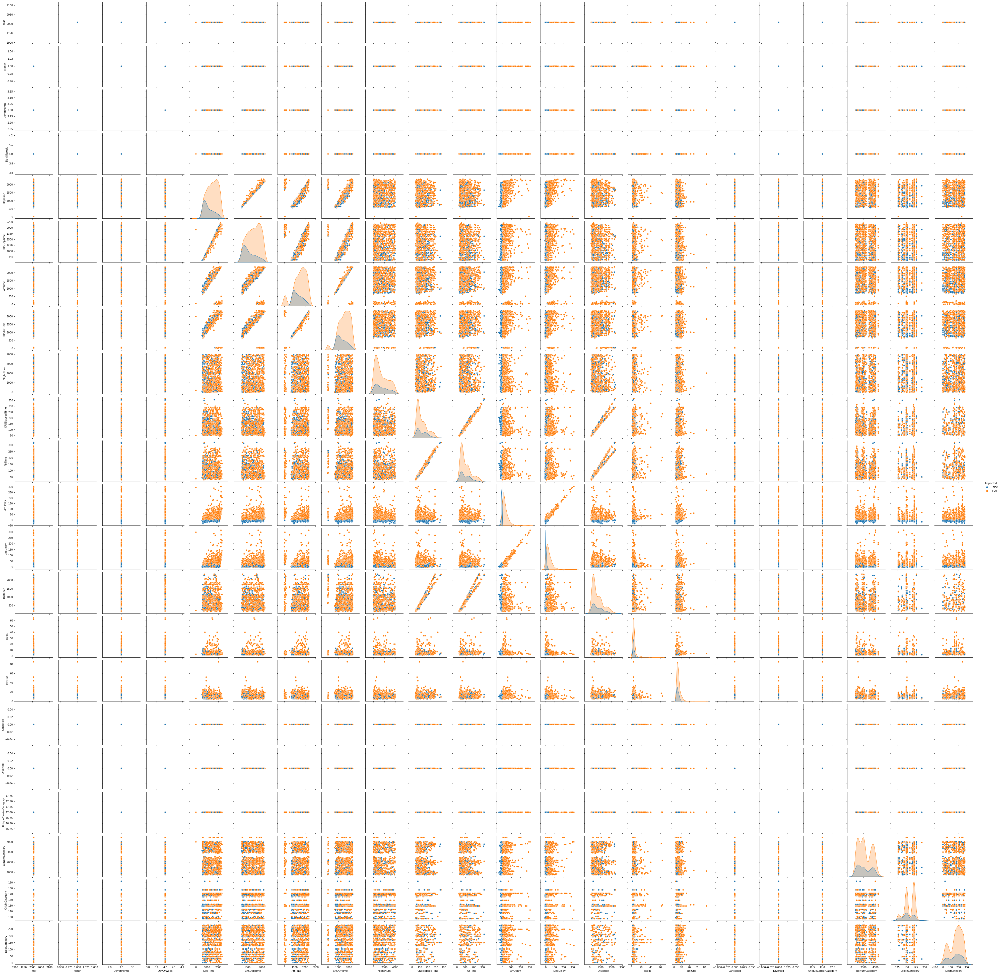

In [23]:
sns.pairplot(df.iloc[:1000], hue="Impacted")

There's not a lot of significance that can be found in these plots, and it seems there is still redundant data that needs to be removed

In [24]:
to_drop = [
    "ArrTime",
    "DepTime",
    "AirTime",
    "Cancelled",
    "Diverted",
    "ArrDelay",
    "DepDelay"
]

In [25]:
df = df.drop(to_drop, axis=1)

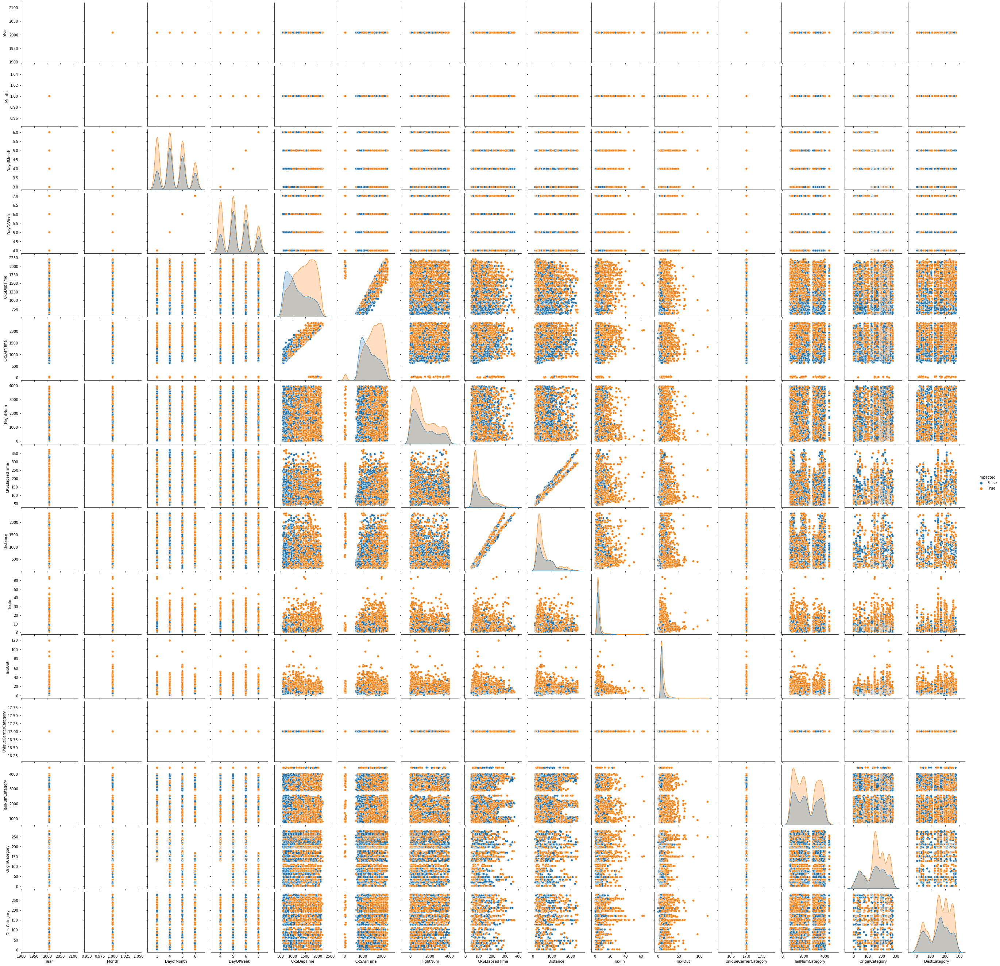

In [26]:
sns.pairplot(df.iloc[:10000], hue="Impacted")

<AxesSubplot:>

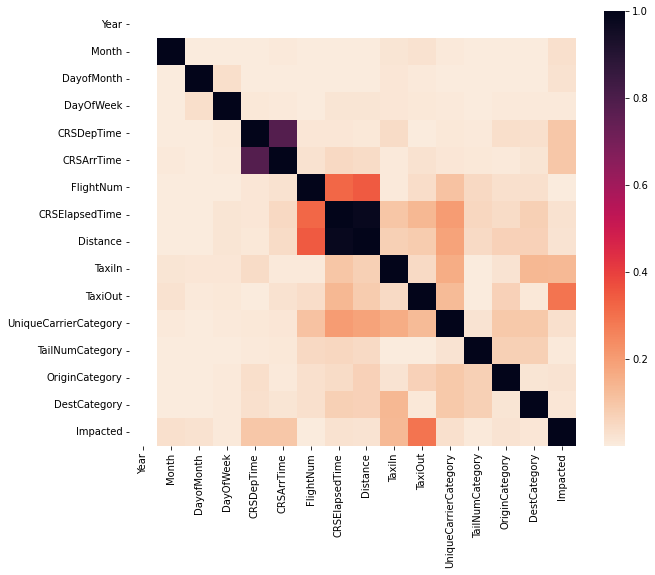

In [27]:
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(df.corr().abs(), annot=False, ax=ax, cmap='rocket_r')

Given the low correlation between variables, I am not expecting this model to perform well

In [28]:
X = df.drop("Impacted", axis=1).to_numpy()
Y = df["Impacted"].to_numpy()
Y = np.where(Y, 1, 0).reshape(Y.shape[0], 1)

In [29]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=0.8)
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, train_size=1/8)

In [30]:
normalizer = Normalizer()
normalizer.fit(X_train)
X_train = normalizer.transform(X_train)
X_val = normalizer.transform(X_val)
X_test = normalizer.transform(X_test)

### Neural Network
I start with a manually coded neural network with hand-calculated gradient functions. The auto-gradients used in common libraries make estimations and have floating point errors that need to be accounted for, so I wanted to try building a network from scratch to compare performance

In [31]:
class Layer:
    def __init__(self, indim, outdim, activation, b1=0.9, b2=0.999, epsilon=1e-8):
        self.weights = np.random.randn(indim+1, outdim)
        self.activation = activation
        self.v = 0
        self.b1 = b1
        self.b2 = b2
        self.epsilon = epsilon
        self.m = np.zeros(shape=outdim)
        self.t = 0
    
    def update(self, deriv, lr, optimizer):
        self.t += 1
        if optimizer == 'adam':
            self.m = (self.b1 * self.m + (1 - self.b1) * deriv)
            self.v = (self.b2 * self.v + (1 - self.b2) * deriv ** 2)
            m_corr = self.m / (1 - self.b1 ** self.t)
            v_corr = self.v / (1 - self.b1 ** self.t)
            self.weights -= lr * m_corr / (np.sqrt(v_corr) + self.epsilon)
        else:
            self.weights -= lr * deriv
        if optimizer == "normalize":
            self.weights /= np.linalg.norm(self.weights)
    
    def forward(self, X):
        _X = np.append(np.ones(X.shape[0]).reshape(X.shape[0],1), X, axis=1)
        _S = _X @ self.weights
        return self.activation(_S), _S, _X
    
    def backward(self, S, w, delta, X):
        delta = self.activation.backward(S) * (delta @ w)[:,:self.weights.shape[1]]
        deriv = X.T @ delta
        return delta
    
    def copy(self):
        return {
            "weights" : self.weights.copy(),
            "activation" : self.activation,
            "v" : self.v,
            "b1" : self.b1,
            "b2" : self.b2,
            "epsilon" : self.epsilon,
            "m" : self.m,
            "t" : self.t
        }

In [32]:
class NN:
    def __init__(self, layer_dims, activations, lr=0.01, bs=None):
        if not bs:
            bs = [(None,None) for _ in layer_dims]
        self.layers = [Layer(layer_dims[i], layer_dims[i+1], activations[i], b1=bs[i][0], b2=bs[i][1]) for i in range(len(layer_dims)-1)]
        self.lr = lr
   
    def forward(self, X):
        S = []
        _X = []
        theta = []
        s = X.copy()
        for layer in self.layers:
            s, _s, x = layer.forward(s)
            S.append(_s)
            _X.append(x)
            theta.append(s)
        
        return theta, S, _X

    def predict(self, X, threshold=0.5):
        return np.where(self.forward(X)[0][-1] >= threshold, True, False)

    def loss(self, Y, Y_pred, epsilon=1e-18):
        return -1 * np.mean(Y*np.log(Y_pred+epsilon) + (1-Y)*np.log(1-Y_pred+epsilon))
    
    def train(self, X, Y, X_val, Y_val, epochs=10, optimizer="", update="", early_stopping=False, patience=1):
        val_losses = []
        train_losses = []
        epochs_tqdm = tqdm(range(epochs))
        val_loss = self.loss(Y_val, self.forward(X_val)[0][-1])
        train_loss = self.loss(Y, self.forward(X)[0][-1])
        epochs_tqdm.set_description(f"train_loss : {train_loss:.4f}, val_loss : {val_loss:.4f}")
        val_losses.append(val_loss)
        train_losses.append(train_loss)
        local_patience = 0
        best = None
        local_best = np.inf
        best_loss = np.inf
        prior_loss = np.inf
        for epoch in epochs_tqdm:
            batch_size = X.shape[0]
            if update == "batch":
                batch_size = 1000
                batches = [i for i in range(X.shape[0]//batch_size)]
                np.random.shuffle(X)
            else:
                batches = [0,X.shape[0]]
            for batch_i in batches:
                batch_x, batch_y = X[batch_size*batch_i:batch_size*(batch_i+1),:], Y[batch_i*batch_size:batch_size*(batch_i+1)]
                theta, S, _X = self.forward(batch_x)
                self.backward(theta, S, _X, batch_y, optimizer)
            val_loss = self.loss(Y_val, self.forward(X_val)[0][-1])
            train_loss = self.loss(Y, self.forward(X)[0][-1])
            if val_loss < best_loss:
                best_loss = val_loss
                best = [layer.copy() for layer in self.layers]
            epochs_tqdm.set_description(f"train_loss : {train_loss:.4f}, val_loss : {val_loss:.4f}")
            val_losses.append(val_loss)
            train_losses.append(train_loss)
            
            if early_stopping:
                if prior_loss - train_loss <= early_stopping and train_loss >= local_best:
                    local_patience += 1
                    if local_patience == patience:
                        break
                else:
                    if train_loss < local_best:
                        local_best = train_loss
                    local_patience = 0
                    prior_loss = train_loss
        
        if best:
            for layer, copy in zip(self.layers, best):
                for k,v in copy.items():
                    setattr(layer, k, v)
        return train_losses, val_losses
    
    def backward(self, theta, S, X, Y, optimizer):
        delta = theta[-1] - Y
        deriv = X[-1].T @ delta
        self.layers[-1].update(deriv, self.lr, optimizer)
        for i in reversed(range(len(self.layers)-1)):
            delta = self.layers[i].backward(S[i], self.layers[i+1].weights.T, delta, X[i])
            deriv = X[i].T @ delta
            self.layers[i].update(deriv, self.lr, optimizer)

In [33]:
class ReLU:
    def __init__(self):
        pass
    
    def __call__(self, x):
        return np.maximum(0,x)
    
    def backward(self, x):
        return np.where(x > 0, 1, 0)

class LeakyReLU:
    def __init__(self, alpha):
        self.alpha = alpha
    
    def __call__(self, x):
        return ((x>0)*x) + ((x<=0)*x*self.alpha)

    def backward(self, x):
        return np.where(x > 0, 1, self.alpha)

class sigmoid:
    def __init__(self):
        pass
    
    def __call__(self, x):
        return 1/(1+np.exp(-1*x))
    
    def backward(self, x):
        return self(x) * (1 - self(x))

class tanh:
    def __init__(self):
        pass
    
    def __call__(self, x):
        return np.tanh(x)
    
    def backward(self, x):
        return 1 - (np.tanh(x)) ** 2

In [41]:
nn = NN([X.shape[1], 10, 1], [LeakyReLU(0.05), sigmoid()], lr=0.005, bs=[(0.999,0.999), (0.999,0.999)])

In [42]:
losses = nn.train(X_train, Y_train, X_val, Y_val, epochs=200, optimizer="adam", early_stopping=1e-4, patience=5)

  0%|          | 0/200 [00:00<?, ?it/s]

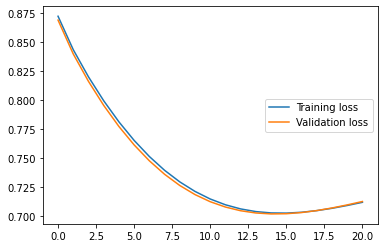

In [43]:
# plt.xticks(range(0,len(losses)))
plt.plot(losses[0], label="Training loss")
plt.plot(losses[1], label="Validation loss")
plt.legend(loc="center right")

  0%|          | 0/200 [00:00<?, ?it/s]

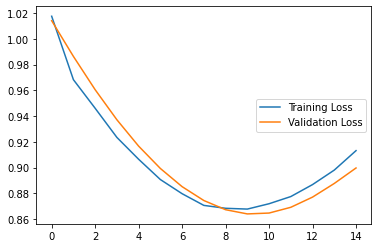

In [39]:
nn = NN([X.shape[1], 10, 1], [tanh(), sigmoid()], lr=0.0001, bs=[(0.999,0.999), (0.999,0.999)])
losses = nn.train(X_train, Y_train, X_val, Y_val, epochs=200, update="batch", optimizer="adam", early_stopping=1e-5, patience=5)
plt.clf()
plt.plot(losses[0], label="Training Loss")
plt.plot(losses[1], label="Validation Loss")
plt.legend(loc="center right")

In [44]:
threshold = 0.5

In [45]:
nn.loss(Y_val, nn.forward(X_val)[0][-1])

0.7019285315934561

In [46]:
np.mean(Y_test == np.where(nn.forward(X_test)[0][-1] >= threshold, 1, 0))

0.5021969540170409

In [47]:
np.mean(Y_train == np.where(nn.forward(X_train)[0][-1] >= threshold, 1, 0))

0.503889419743419

In [48]:
np.max(nn.forward(X_train)[0][-1])

0.7107502973330331

In [49]:
1 - np.mean(Y_train)

0.5233347936624018

In [50]:
X_train_tensor = torch.from_numpy(X_train)
X_val_tensor = torch.from_numpy(X_val)
X_test_tensor = torch.from_numpy(X_test)
Y_train_tensor = torch.from_numpy(Y_train)
Y_val_tensor = torch.from_numpy(Y_val)
Y_test_tensor = torch.from_numpy(Y_test)

## Part 1 - Library
I already have extensive experience with TensorFlow, so I decided to use PyTorch to get more experience with this library. In particular, the biggest difference I had to learn was the behavior of torch.Tensor.backward (https://pytorch.org/docs/stable/generated/torch.Tensor.backward.html?highlight=backward#torch.Tensor.backward), both for understanding how to use it and also to understand how it behaves. I used the PyTorch autogradient backward functionality for improved operating time and to see how the results differed from my manual implementation. Due to the computational graph with varying derivation methods, I expected PyTorch to achieve slightly different results than my own.

## Part 2 - Implementation
I used the adam optimizer with early stopping and best loss model memorization. I found tanh was a good middle layer activation function to constrain the input to layer 2, and sigmoid() was necessary for the second layer to constrain the output to a probability space. For the optimizer, I used beta_1=0.999, beta_2=0.999, and epsilon=1e-8 for adam hyperparamters and learning rate of 0.001. I found early stopping metric of 1e-4 and patience of 5 worked best to avoid any sudden jumps in loss.

In [51]:
class torchReLU:
    def __init__(self):
        pass
    
    def __call__(self, x):
        return torch.maximum(0,x)
    
    def backward(self, x):
        return torch.where(x > 0, 1, 0)

class torchLeakyReLU:
    def __init__(self, alpha):
        self.alpha = alpha
    
    def __call__(self, x):
        return ((x>0)*x) + ((x<=0)*x*self.alpha)

    def backward(self, x):
        return torch.where(x > 0, 1, self.alpha)

class torchsigmoid:
    def __init__(self):
        pass
    
    def __call__(self, x):
        return 1/(1+torch.exp(-1*x))
    
    def backward(self, x):
        return self(x) * (1 - self(x))

class torchtanh:
    def __init__(self):
        pass
    
    def __call__(self, x):
        return torch.tanh(x)
    
    def backward(self, x):
        return 1 - (torch.tanh(x)) ** 2

In [52]:
class autoLayer:
    def __init__(self, indim, outdim, activation, b1=0.9, b2=0.999, epsilon=1e-8):
        self.weights = torch.rand(size=(indim+1, outdim), requires_grad=True).double()
        self.weights.retain_grad()
        self.activation = activation
        self.v = 0
        self.b1 = b1
        self.b2 = b2
        self.epsilon = epsilon
        self.m = torch.zeros(size=(1, outdim)).double()
        self.t = 0
        self.act_result = None
    
    def update(self, lr, optimizer=""):
        self.t += 1
        if optimizer == 'adam':
            self.m = (self.b1 * self.m + (1 - self.b1) * self.weights.grad)
            self.v = (self.b2 * self.v + (1 - self.b2) * self.weights.grad ** 2)
            m_corr = self.m / (1 - self.b1 ** self.t)
            v_corr = self.v / (1 - self.b1 ** self.t)
            with torch.no_grad():
                self.weights.sub_(lr * m_corr / (torch.sqrt(v_corr) + self.epsilon))
        else:
            with torch.no_grad():
                self.weights.sub_(lr * self.weights.grad)
        # self.weights.grad.zero_()
    
    def forward(self, X):
        _X = torch.cat((torch.ones(size=(X.shape[0],1)), X), axis=1).double()
        _S = _X @ self.weights
        self.act_result = self.activation(_S)
        return self.act_result, _S, _X
    
    def copy(self):
        return {
            "weights" : self.weights.clone().detach(),
            "activation" : self.activation,
            "v" : self.v,
            "b1" : self.b1,
            "b2" : self.b2,
            "epsilon" : self.epsilon,
            "m" : self.m.clone().detach(),
            "t" : self.t
        }

In [53]:
class autoNN:
    def __init__(self, layer_dims, activations, lr=0.01, bs=None):
        if not bs:
            bs = [(None,None) for _ in layer_dims]
        self.layers = [autoLayer(layer_dims[i], layer_dims[i+1], activations[i], b1=bs[i][0], b2=bs[i][1]) for i in range(len(layer_dims)-1)]
        self.lr = lr
        self._l = 0
    
    def predict(self, X, threshold=0.5):
        return torch.where(self.forward(X)[0][-1] >= threshold, True, False)
   
    def forward(self, X, grad=False):
        S = []
        _X = []
        theta = []
        s = X.clone()
        for layer in self.layers:
            if not grad:
                with torch.no_grad():
                    s, _s, x = layer.forward(s)
            else:
                s, _s, x = layer.forward(s)
            S.append(_s)
            _X.append(x)
            theta.append(s)
        
        return theta, S, _X

    def loss(self, Y, Y_pred, epsilon=1e-18, grad=False):
        if not grad:
            with torch.no_grad():
                return -1 * torch.mean(Y*torch.log(Y_pred+epsilon) + (1-Y)*torch.log(1-Y_pred+epsilon))
        return -1 * torch.mean(Y*torch.log(Y_pred+epsilon) + (1-Y)*torch.log(1-Y_pred+epsilon))
    
    def train(self, X, Y, X_val, Y_val, epochs=10, optimizer="", update="", early_stopping=False, patience=1):
        val_losses = []
        train_losses = []
        epochs_tqdm = tqdm(range(epochs))
        val_loss = self.loss(Y_val, self.forward(X_val)[0][-1])
        train_loss = self.loss(Y, self.forward(X)[0][-1])
        epochs_tqdm.set_description(f"train_loss : {train_loss:.4f}, val_loss : {val_loss:.4f}")
        val_losses.append(val_loss)
        train_losses.append(train_loss)
        local_patience = 0
        local_best = np.inf
        best = None
        best_loss = np.inf
        prior_loss = np.inf
        for epoch in epochs_tqdm:
            batch_size = X.size()[0]
            if update == "batch":
                batch_size = 1000
                batches = torch.randperm(X.size()[0]//batch_size)
            else:
                batches = [0,X.shape[0]]
            for batch_i in batches:
                batch_x, batch_y = X[batch_size*batch_i:batch_size*(batch_i+1),:], Y[batch_i*batch_size:batch_size*(batch_i+1)]
                theta, S, _X = self.forward(batch_x, grad=True)
                self._l = self.loss(batch_y, theta[-1], grad=True)
                self.backward(theta, S, _X, batch_y, optimizer)
            with torch.no_grad():
                val_loss = self.loss(Y_val, self.forward(X_val)[0][-1])
                train_loss = self.loss(Y, self.forward(X)[0][-1])
            if val_loss < best_loss:
                best_loss = val_loss
                best = [layer.copy() for layer in self.layers]
            epochs_tqdm.set_description(f"train_loss : {train_loss:.4f}, val_loss : {val_loss:.4f}")
            val_losses.append(val_loss)
            train_losses.append(train_loss)
            
            if early_stopping:
                if prior_loss - train_loss <= early_stopping and train_loss >= local_best:
                    local_patience += 1
                    if local_patience == patience:
                        break
                else:
                    if train_loss < local_best:
                        local_best = train_loss
                    local_patience = 0
                    prior_loss = train_loss
        
        if best:
            for layer, copy in zip(self.layers, best):
                for k,v in copy.items():
                    setattr(layer, k, v)
        return train_losses, val_losses
    
    def backward(self, theta, S, X, Y, optimizer):
        self._l.backward()
        for layer in self.layers:
            layer.update(self.lr)

In [54]:
autonn = autoNN([X_train_tensor.size()[1], 10, 1], [torchtanh(), torchsigmoid()], lr=0.001, bs=[(0.999,0.999), (0.999,0.999)])

In [55]:
losses = autonn.train(X_train_tensor, Y_train_tensor, X_val_tensor, Y_val_tensor, epochs=200, early_stopping=1e-4, patience=5, optimizer='adam')

  0%|          | 0/200 [00:00<?, ?it/s]

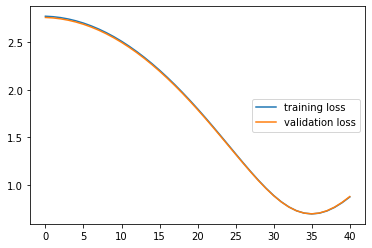

In [56]:
plt.plot(losses[0], label="training loss")
plt.plot(losses[1], label="validation loss")
plt.legend(loc="center right")
plt.show()

In [57]:
Y_hat_tensor = autonn.forward(X_train_tensor)[0][-1]

In [58]:
Y_pred_tensor = torch.where(Y_hat_tensor >= 0.5, True, False)

In [59]:
torch.sum(Y_pred_tensor == Y_train_tensor) / Y_hat_tensor.size()[0]

tensor(0.5233)

In [60]:
min(Y_hat_tensor[Y_train_tensor==True])

tensor(0.4592, dtype=torch.float64)

In [63]:
triplenn = autoNN([X_train_tensor.size()[1], X_train_tensor.size()[1]//2, X_train_tensor.size()[1]//4, 1], [torchLeakyReLU(0.01), torchtanh(), torchsigmoid()], lr=0.001, bs=[(0.999,0.999), (0.999,0.999), (0.999,0.999)])

In [64]:
losses = triplenn.train(X_train_tensor, Y_train_tensor, X_val_tensor, Y_val_tensor, epochs=200, early_stopping=1e-4, patience=5, optimizer='adam')

  0%|          | 0/200 [00:00<?, ?it/s]

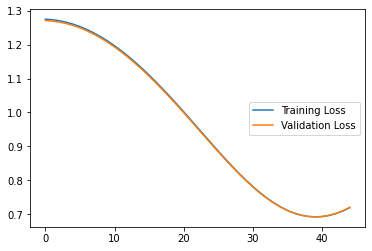

In [65]:
plt.clf()
plt.plot(losses[0], label="Training Loss")
plt.plot(losses[1], label="Validation Loss")
plt.legend(loc="center right")
plt.show()

In [66]:
torch.sum(triplenn.predict(X_test_tensor) == Y_test_tensor) / Y_test_tensor.size()[0]

tensor(0.5213)

## Part 3 - Hyperparameters
I used a lazy-generated binary search on the hyperparamters (by this I mean I intuitively selected higher or lower hyperparameter values depending on model performance. In retrospect, I could have programmed it, but I realized very quickly that the hyperparameters were not significantly impacting the model performance). I used regularization on the weights (l-1 normalization) because I was noticing the first layer was outputing insanely high values that were forcing tanh to return all 1s into the second layer, meaning all inputs would produce the same output. Despite regularization, it would seem the model is still predicting all False outputs... I used the adam optimizer because the model would either make high jumps in the loss function at higher learning rates or take far too long to converge at lower learning rates. Adam solved this problem for higher learning rates, allowing faster convergence.

## Part 4 - Baseline
I chose a random forest classifier approach for my benchmark. Due to the highly categorical nature of the data and the low covariance, random forests may be useful.

As we can see in the results dataframe, the benchmark performed far better than the neural networks in all metrics except testing accuracy, which is likely due to the neural networks predicting all inputs as False, meaning the accuracy was equal to the True/False ratio in the data. I believe this is due to the model not being able to find reliable continuous patterns in a dataset with low covariance, while the random forest classifier was able to find reliable discrete patterns.

In [67]:
rfc = RandomForestClassifier(n_estimators=12, verbose=2).fit(X_train, Y_train)

C:\Users\iamje\AppData\Local\Temp/ipykernel_39656/3790015422.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc = RandomForestClassifier(n_estimators=12, verbose=2).fit(X_train, Y_train)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 12


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.8s remaining:    0.0s


building tree 2 of 12
building tree 3 of 12
building tree 4 of 12
building tree 5 of 12
building tree 6 of 12
building tree 7 of 12
building tree 8 of 12
building tree 9 of 12
building tree 10 of 12
building tree 11 of 12
building tree 12 of 12


[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:   24.8s finished


In [68]:
results_df = pd.DataFrame({
    "Model" : ["NN", "PytorchNN", "3-Layer PytorchNN", "RandomForest"],
    "Training f1-score" : [f1_score(nn.predict(X_train), Y_train),
                  f1_score(autonn.predict(X_train_tensor), Y_train_tensor),
                  f1_score(triplenn.predict(X_train_tensor), Y_train_tensor),
                  f1_score(rfc.predict(X_train), Y_train)
                 ],
    "Training log_loss" : [log_loss(Y_train, nn.predict(X_train)),
                  log_loss(Y_train_tensor, autonn.predict(X_train_tensor)),
                  log_loss(Y_train_tensor, triplenn.predict(X_train_tensor)),
                  log_loss(rfc.predict(X_train), Y_train)
                 ],
    "Training accuracy" : [accuracy_score(nn.predict(X_train), Y_train),
                  accuracy_score(autonn.predict(X_train_tensor), Y_train_tensor),
                  accuracy_score(triplenn.predict(X_train_tensor), Y_train_tensor),
                  accuracy_score(rfc.predict(X_train), Y_train)],
    "Training precision" : [precision_score(nn.predict(X_train), Y_train),
                  precision_score(autonn.predict(X_train_tensor), Y_train_tensor),
                  precision_score(triplenn.predict(X_train_tensor), Y_train_tensor),
                  precision_score(rfc.predict(X_train), Y_train)],
    "Training recall" : [recall_score(nn.predict(X_train), Y_train),
                  recall_score(autonn.predict(X_train_tensor), Y_train_tensor),
                  recall_score(triplenn.predict(X_train_tensor), Y_train_tensor),
                  recall_score(rfc.predict(X_train), Y_train)],
    "Testing f1-score" : [f1_score(nn.predict(X_test), Y_test),
                  f1_score(autonn.predict(X_test_tensor), Y_test_tensor),
                  f1_score(triplenn.predict(X_test_tensor), Y_test_tensor),
                  f1_score(rfc.predict(X_test), Y_test)
                 ],
    "Testing log_loss" : [log_loss(Y_test, nn.predict(X_test)),
                  log_loss(Y_test_tensor, autonn.predict(X_test_tensor)),
                  log_loss(Y_test_tensor, triplenn.predict(X_test_tensor)),
                  log_loss(rfc.predict(X_test), Y_test)
                 ],
    "Testing accuracy" : [accuracy_score(nn.predict(X_test), Y_test),
                  accuracy_score(autonn.predict(X_test_tensor), Y_test_tensor),
                  accuracy_score(triplenn.predict(X_test_tensor), Y_test_tensor),
                  accuracy_score(rfc.predict(X_test), Y_test)],
    "Testing precision" : [precision_score(nn.predict(X_test), Y_test),
                  precision_score(autonn.predict(X_test_tensor), Y_test_tensor),
                  precision_score(triplenn.predict(X_test_tensor), Y_test_tensor),
                  precision_score(rfc.predict(X_test), Y_test)],
    "Testing recall" : [recall_score(nn.predict(X_test), Y_test),
                  recall_score(autonn.predict(X_test_tensor), Y_test_tensor),
                  recall_score(triplenn.predict(X_test_tensor), Y_test_tensor),
                  recall_score(rfc.predict(X_test), Y_test)]
})

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.8s finished
C:\Users\iamje\AppData\Local\Programs\Python\Python310\lib\site-packages\skl

In [69]:
results_df

,Model,Training f1-score,Training log_loss,Training accuracy,Training precision,Training recall,Testing f1-score,Testing log_loss,Testing accuracy,Testing precision,Testing recall
0,NN,0.434777,17.135221,0.503889,0.400297,0.475758,0.433218,17.193675,0.502197,0.397410,0.476116
1,PytorchNN,0.000506,16.463910,0.523321,0.000253,0.472973,0.000558,16.535161,0.521258,0.000279,0.455882
2,3-Layer PytorchNN,0.000000,16.463433,0.523335,0.000000,0.000000,0.000000,16.534267,0.521284,0.000000,0.000000
3,RandomForest,0.989878,0.330872,0.990420,0.982675,0.997187,0.412126,17.055843,0.506190,0.361574,0.479110
